router.push(url, as, options)

클라이언트 측 전환을 처리합니다. 이 방법은 next/link가 충분하지 않은 경우에 유용합니다.
url: UrlObject | String: 탐색할 URL
as: UrlObject | String: 브라우저 URL 표시줄에 표시될 경로에 대한 선택적 데코레이터입니다.
```
router.push({
pathname: '/post/[pid]',
query: { pid: post.id },
})
```
+ 외부 URL에 대해서는 router.push()를 사용할 필요가 없습니다.
window.location을 사용하는 것이 더 적합합니다.
https://nextjs.org/docs/api-reference/next/router#routerpush

Movie Detail API
API: https://api.themoviedb.org/3/movie/{movie_id}?api_key=api_key&language=en-US
https://developers.themoviedb.org/3/movies/get-movie-details

Link에도 as props 사용 가능
https://nextjs.org/docs/api-reference/next/link

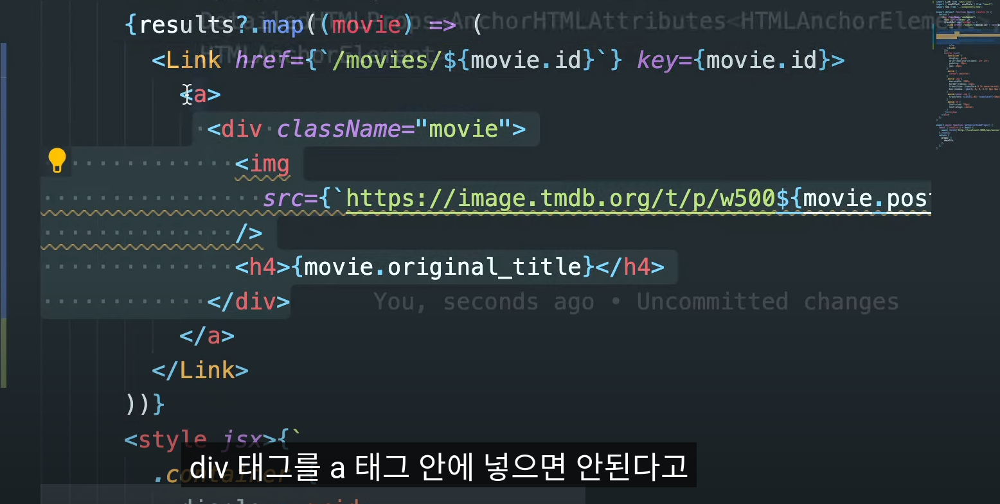

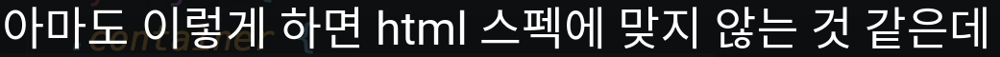

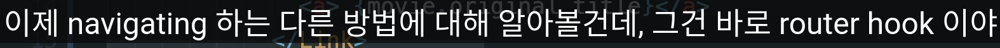

# index.js
```jsx
import Seo from "@/components/Seo";
import Link from "next/link";
import { useRouter } from "next/router";

export default function Home({ results }) {
  const router = useRouter();

  const onClick = (id) => {
    router.push(`/movies/${id}`);
  };

  return (
    <div className="container">
      <Seo title="Home" />
      {results?.map((movie) => (
        <div className="movie">
          <Link href={`/movies/${movie.id}`} key={movie.id}>
            <img src={`https://image.tmdb.org/t/p/w500${movie.poster_path}`} />
          </Link>
          <h4 onClick={()=>onClick(movie.id)}>{movie.original_title}</h4>
        </div>
      ))}
      <style jsx>{`
        .container {
          display: grid;
          grid-template-columns: 1fr 1fr;
          padding: 20px;
          gap: 20px;
        }
        .movie {
          cursor: pointer;
        }
        .movie img {
          max-width: 100%;
          border-radius: 12px;
          transition: transform 0.2s ease-in-out;
          box-shadow: rgba(0, 0, 0, 0.1) 0px 4px 12px;
        }
        .movie:hover img {
          transform: scale(1.05) translateY(-10px);
        }
        .movie h4 {
          font-size: 18px;
          text-align: center;
        }
      `}</style>
    </div>
  );
}

export async function getServerSideProps() {
  const { results } = await (
    await fetch(`http://localhost:3000/api/movies`)
  ).json();

  return {
    props: {
      results,
    },
  };
}

```

# same the way Link , routerpush

# next.cofig.js
```js
/** @type {import('next').NextConfig} */
const API_KEY = process.env.NEXT_PUBLIC_API_KEY;

const nextConfig = {
  reactStrictMode: true,
  async redirects() {
    return [
      {
        source: "/old-blog/:path*",
        destination: "/new-sexy-blog/:path*",
        permanent: false,
      },
    ];
  },
  async rewrites() {
    return [
      {
        source: "/api/movies",
        destination: `https://api.themoviedb.org/3/movie/popular?api_key=${API_KEY}`,
      },
      {
        source: "/api/movies/:id",
        destination: `https://api.themoviedb.org/3/movie/:id?api_key=${API_KEY}`,

      }
    ];
  },
};

module.exports = nextConfig;

```

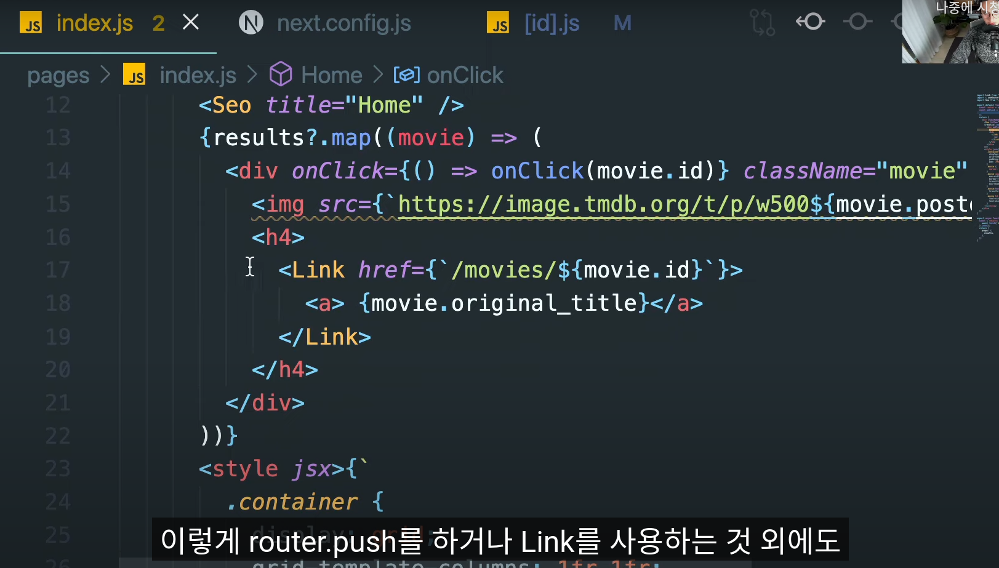

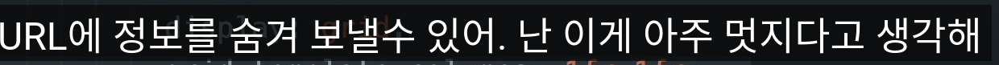

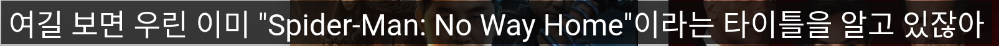

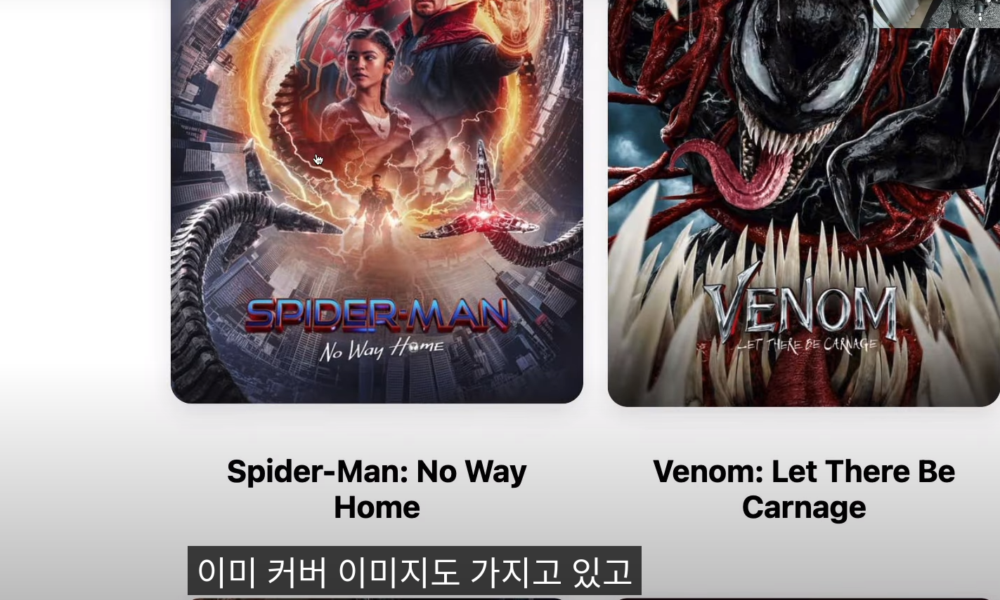

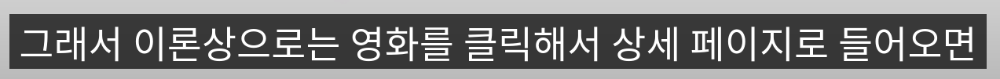

...

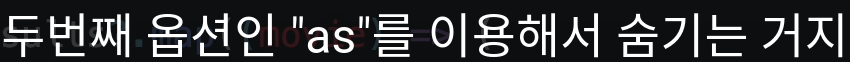

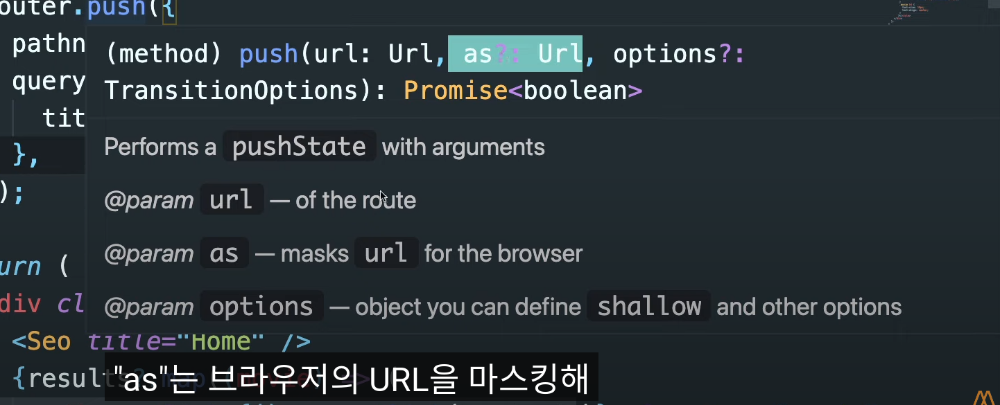

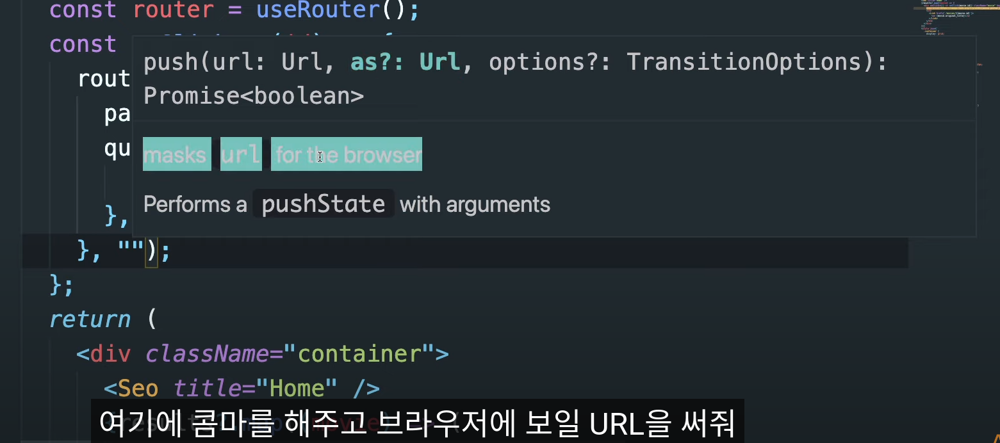

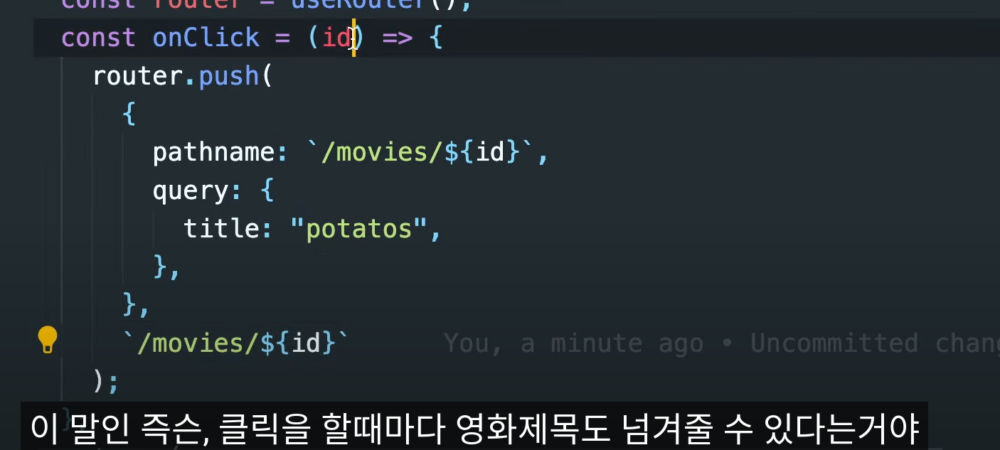

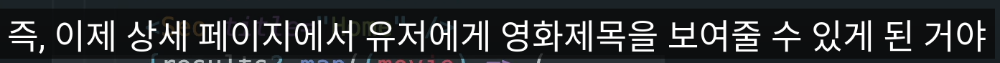

# index.js
```jsx
import Seo from "@/components/Seo";
import Link from "next/link";
import { useRouter } from "next/router";

export default function Home({ results }) {
  const router = useRouter();

  const onClick = (id, title) => {
    // router.push(`/movies/${id}`);
    router.push(
      {
        pathname: `/movies/${id}`,
        query: {
          title,
        },
      },
      `/movies/${id}`
    );
  };

  return (
    <div className="container">
      <Seo title="Home" />
      {results?.map((movie) => (
        <div className="movie" key={movie.id}>
          <Link
            href={{
              pathname: `/movies/${movie.id}`,
              query: {
                title: movie.original_title,
              },
            }}
            as={`/movies/${movie.id}`}
          >
            <img src={`https://image.tmdb.org/t/p/w500${movie.poster_path}`} />
          </Link>
          <h4 onClick={() => onClick(movie.id, movie.original_title)}>
            {movie.original_title}
          </h4>
        </div>
      ))}
      <style jsx>{`
        .container {
          display: grid;
          grid-template-columns: 1fr 1fr;
          padding: 20px;
          gap: 20px;
        }
        .movie {
          cursor: pointer;
        }
        .movie img {
          max-width: 100%;
          border-radius: 12px;
          transition: transform 0.2s ease-in-out;
          box-shadow: rgba(0, 0, 0, 0.1) 0px 4px 12px;
        }
        .movie:hover img {
          transform: scale(1.05) translateY(-10px);
        }
        .movie h4 {
          font-size: 18px;
          text-align: center;
        }
      `}</style>
    </div>
  );
}

export async function getServerSideProps() {
  const { results } = await (
    await fetch(`http://localhost:3000/api/movies`)
  ).json();

  return {
    props: {
      results,
    },
  };
}

  ```

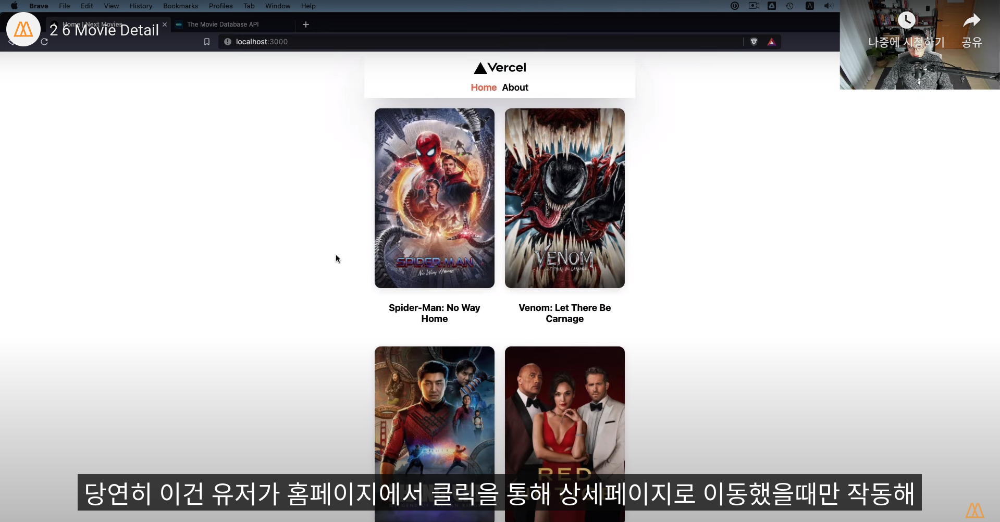

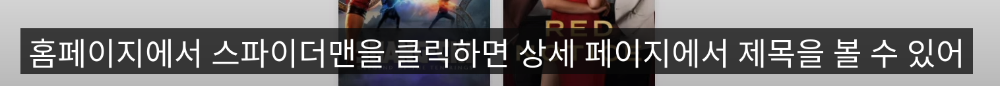

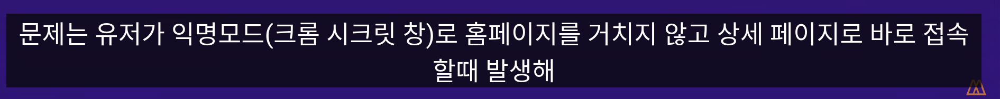

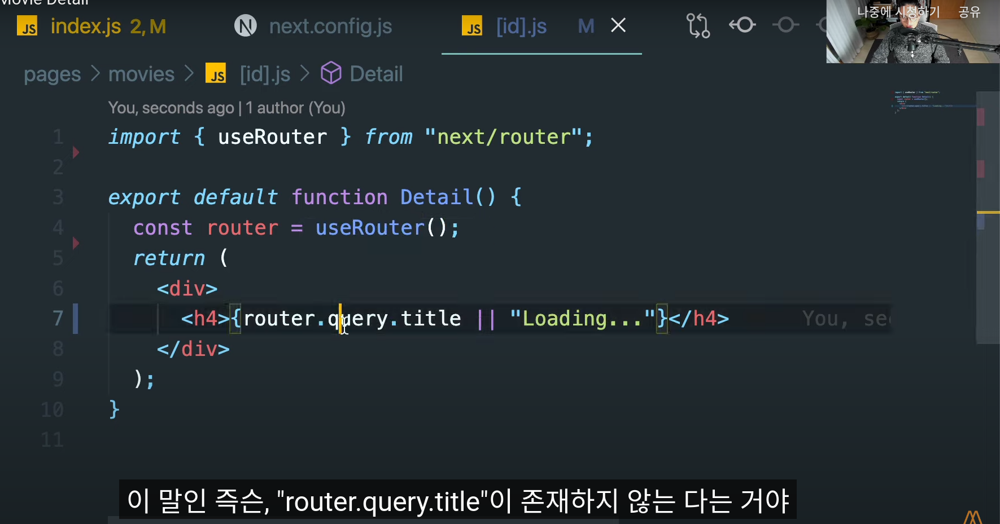

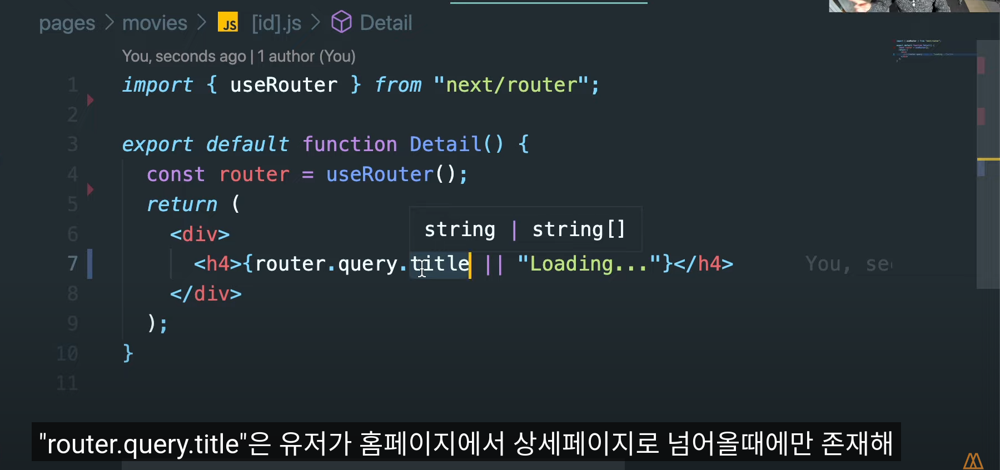

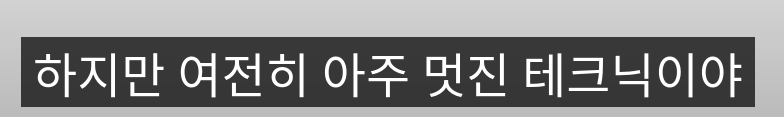

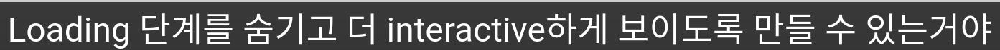

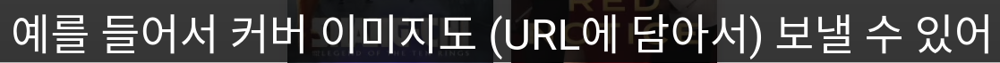

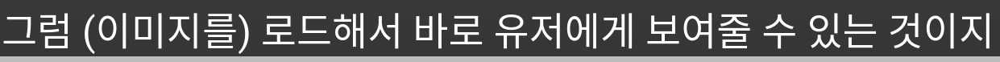

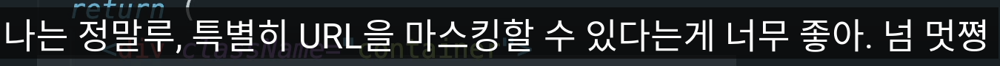